Importing required libraries

In [ ]:
import tensorflow as tf
import os
import numpy as np
from IPython.display import display, Image
from keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator

Mounting Google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive') #Mounting google drive

Mounted at /content/drive


Defining the function to load the model and predict the image classes

In [ ]:
#Function that takes saved model path (i.e .pb file path) and images directory path and prints the Images containing dams along with filenames.
#Each image must be of size 500x500

def low_head_dam(model_path, directory_path):
  model = tf.keras.models.load_model(model_path) #loading model

  #Loop to read each image individually from the directory
  for filename in os.listdir(directory_path):
    img = load_img(os.path.join(directory_path, filename)) #loading image
    img_arr = img_to_array(img)  #converting image to array
    img_arr = np.reshape(img_arr, (1,500,500,3)) #reshaping the image 
    datagen = ImageDataGenerator(rescale=1./255) #creating an image data generator object with rescale
    trial_X = datagen.flow(img_arr,batch_size=1) #loading the image through data generator object -- preprocessing
    pred = model.predict(trial_X) #predicting the probability
    predicted_class = ["Dam" if x<=0.5 else "NoDam" for x in pred] #assigning labels - dam if probability is less than 0.5 else nodam
    if(predicted_class == ["Dam"]): #If the image contains dam, print the filename of the image and display the image
      print(filename , "---->" ,  predicted_class, pred)
      display(Image(filename=os.path.join(directory_path, filename)))

Testing the function

sample_191000.png ----> ['Dam'] [[0.29876792]]


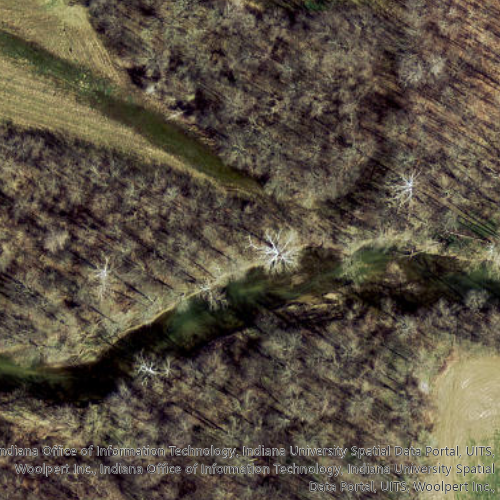

sample_193000.png ----> ['Dam'] [[0.06198884]]


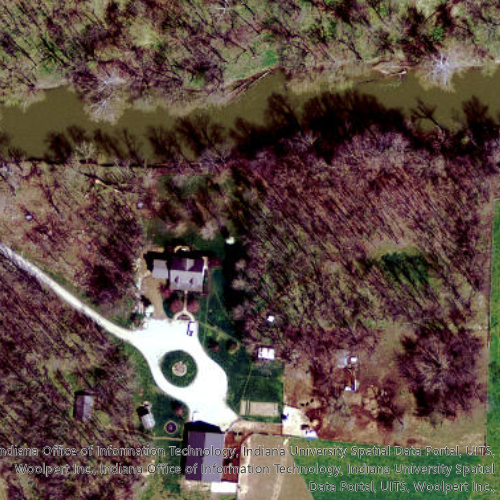

sample_200000.png ----> ['Dam'] [[0.44701582]]


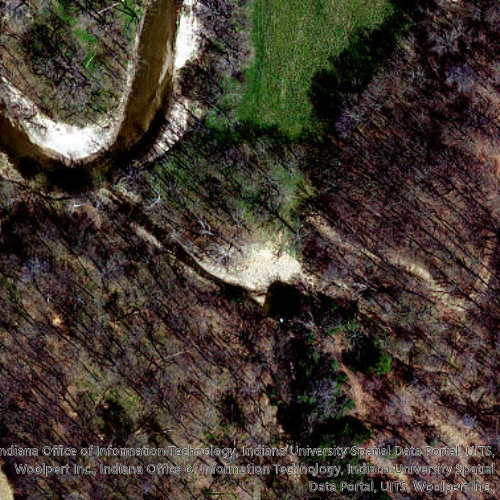

sample_201000.png ----> ['Dam'] [[0.3063774]]


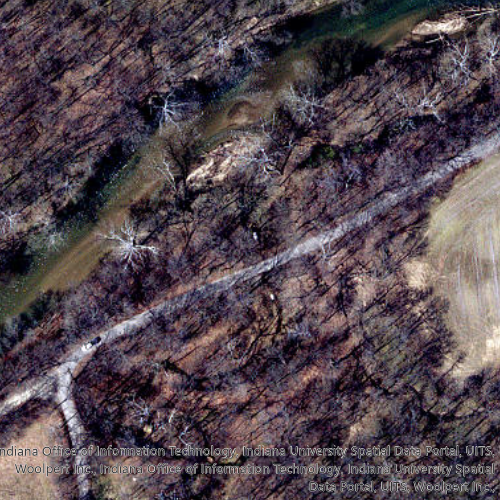

sample_202000.png ----> ['Dam'] [[0.34631887]]


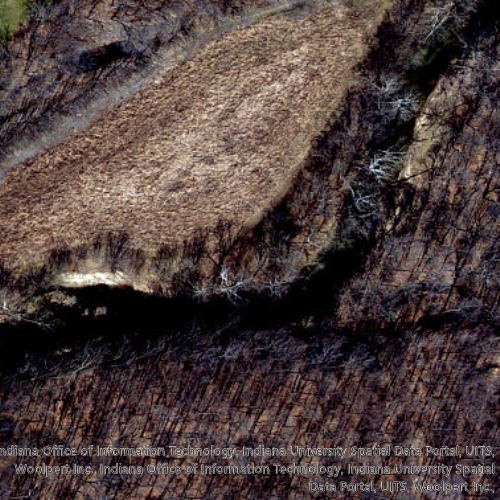

sample_205000.png ----> ['Dam'] [[0.25095105]]


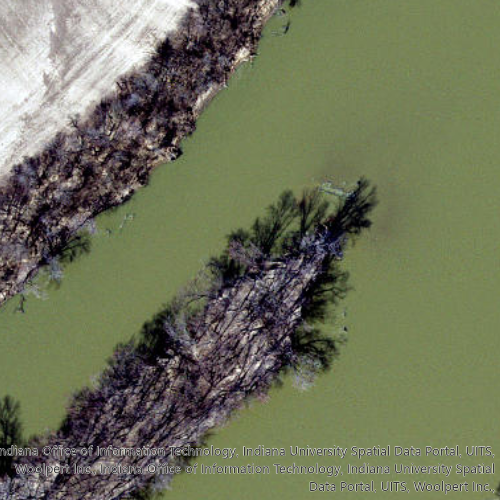

sample_208000.png ----> ['Dam'] [[0.31727642]]


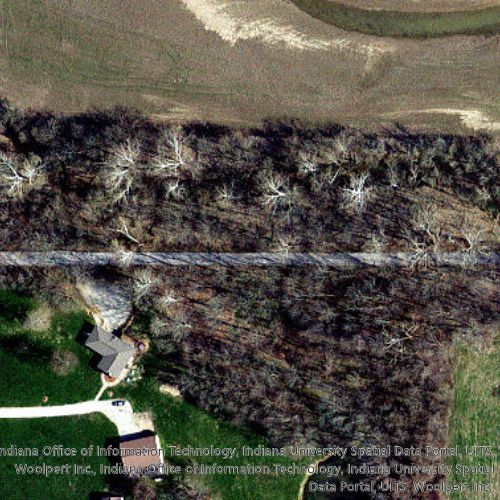

sample_210000.png ----> ['Dam'] [[0.35575306]]


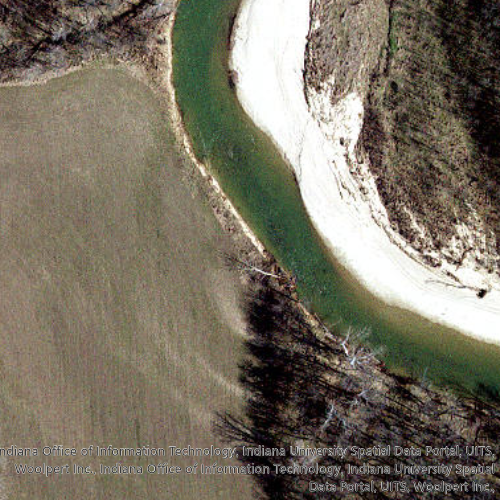

sample_213000.png ----> ['Dam'] [[0.40667465]]


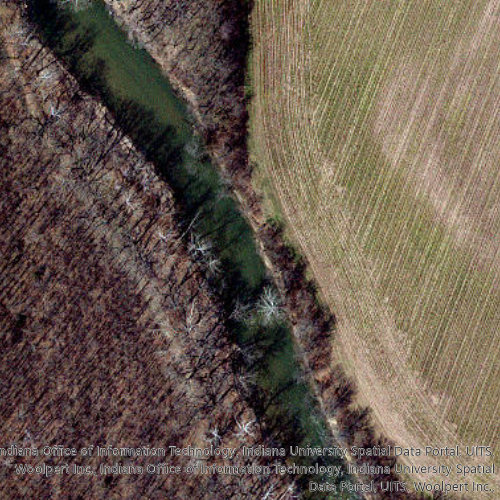

sample_216000.png ----> ['Dam'] [[0.02782441]]


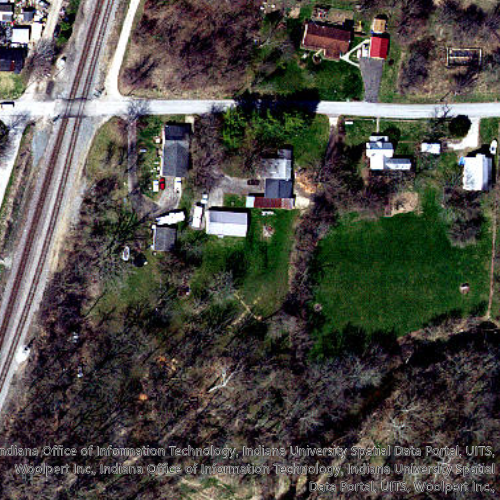

sample_215000.png ----> ['Dam'] [[0.04929496]]


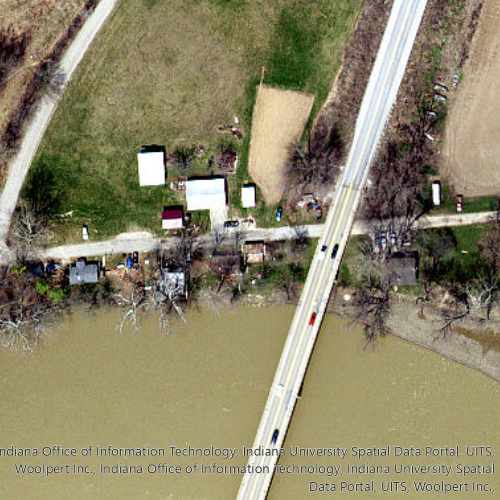

sample_221000.png ----> ['Dam'] [[0.27153915]]


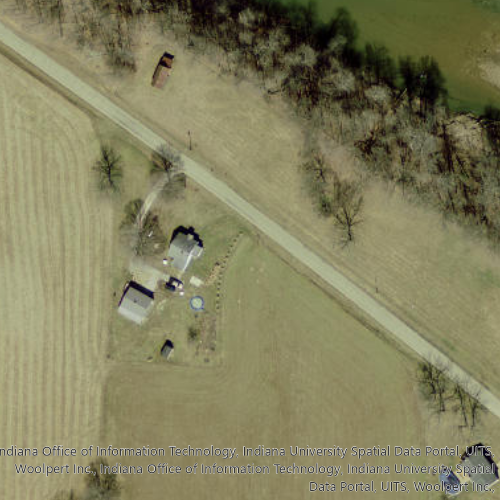

sample_241000.png ----> ['Dam'] [[0.45310077]]


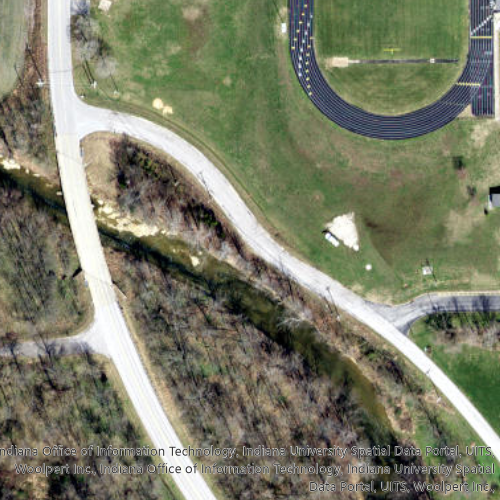

sample_245000.png ----> ['Dam'] [[0.2486795]]


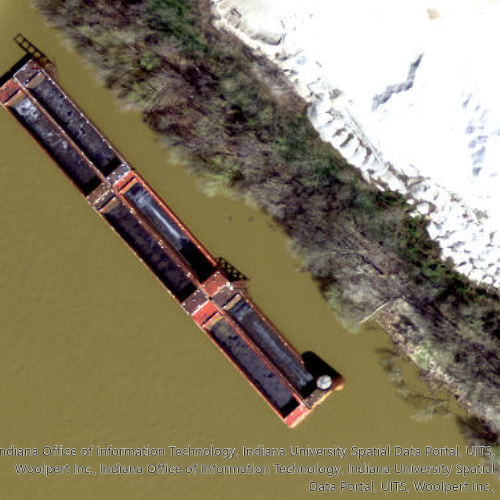

sample_251000.png ----> ['Dam'] [[0.23541546]]


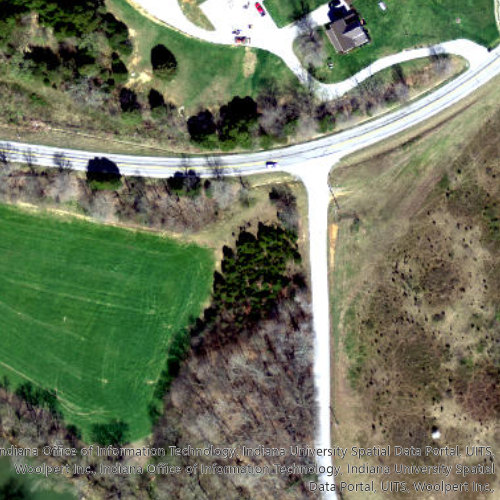

sample_252000.png ----> ['Dam'] [[0.35312012]]


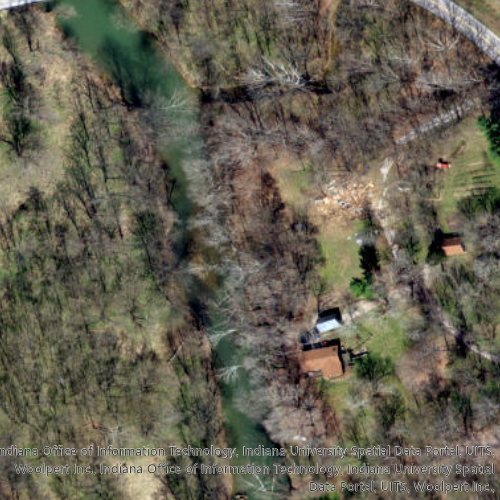

sample_253000.png ----> ['Dam'] [[0.28763214]]


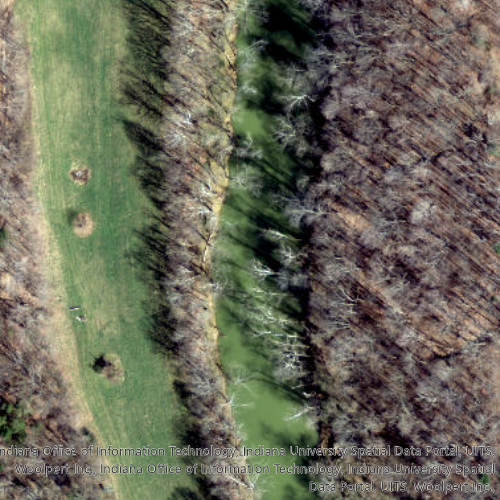

sample_261000.png ----> ['Dam'] [[0.45869535]]


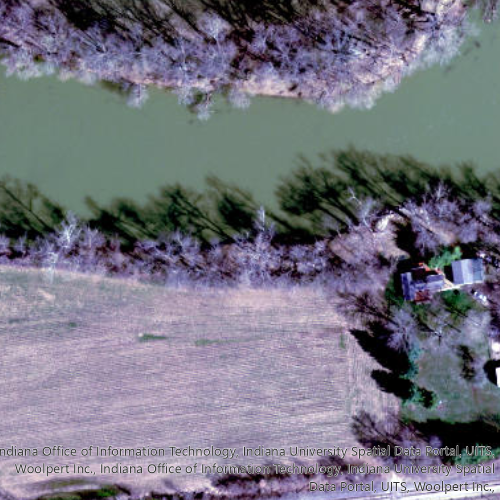

sample_275000.png ----> ['Dam'] [[0.31267568]]


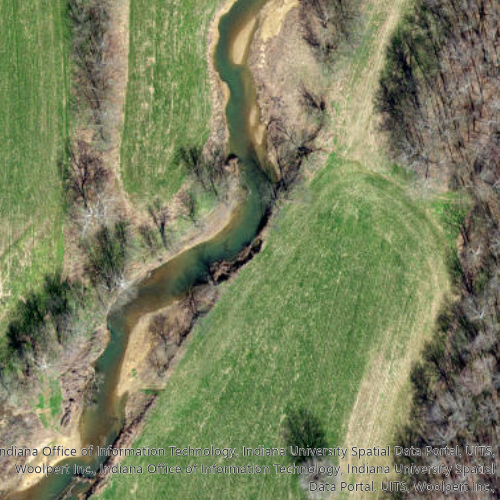

sample_295000.png ----> ['Dam'] [[0.4390398]]


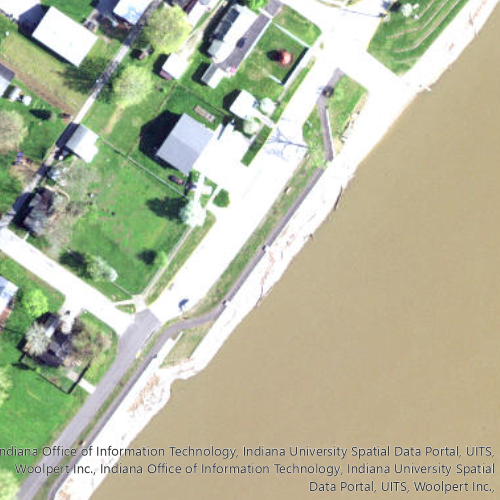

In [ ]:
model_saved_path = '/content/drive/My Drive/DLProject/mymod/source_code12/saved_model_face' #path to saved model
images_directory = '/content/drive/My Drive/data/trial/' #path of images directory

low_head_dam(model_saved_path, images_directory )
